# Try ML

Try Clara Burgard example: https://github.com/ClimateClara/basal_melt_neural_network/blob/master/notebooks/DNN_Clara_several_years.ipynb

Env: `phd_v3_ml`

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
# sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
sys.path.insert(1, '/home/lalandmi/Dropbox/Thèse/notebooks/utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()


# ML
from tensorflow import keras

3.7.8 | packaged by conda-forge | (default, Jul 31 2020, 02:25:08) 
[GCC 7.5.0]


/home/lalandmi/miniconda3/envs/phd_ml_v0/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lalandmi/miniconda3/envs/phd_ml_v0/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lalandmi/miniconda3/envs/phd_ml_v0/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lalandmi/miniconda3/en

## Try with few tiles (1°x1°)

In [2]:
path = '/home/lalandmi/Dropbox/data/HMA_UCLA_Reanalysis/'

### Load sd, swe and sca

In [3]:
ds = xr.open_mfdataset('/home/lalandmi/Dropbox/data/HMA_UCLA_Reanalysis/5000001147190/*/HMA_SR_D_v01_N*E*_agg_16_WY1999_00_SD_POST.nc')
# ds = xr.open_dataset(path+'5000001147190/210524848/HMA_SR_D_v01_N36_0E74_0_agg_16_WY1999_00_SD_POST.nc')

# Add time coordinates (time starts 1rst october)
ds = ds.assign_coords(Day=pd.date_range(start='1999-10-01', periods=ds.Day.size, freq='D'))
sd = ds.SD_Post.isel(Stats=0).rename({'Longitude': 'lon', 'Latitude': 'lat', 'Day': 'time'}).transpose("time", "lat", "lon")

In [4]:
ds = xr.open_mfdataset('/home/lalandmi/Dropbox/data/HMA_UCLA_Reanalysis/5000001147190/*/HMA_SR_D_v01_N*E*_agg_16_WY1999_00_SWE_SCA_POST.nc')
# ds = xr.open_dataset(path+'5000001147190/210524848/HMA_SR_D_v01_N36_0E74_0_agg_16_WY1999_00_SWE_SCA_POST.nc')

ds = ds.assign_coords(Day=pd.date_range(start='1999-10-01', periods=ds.Day.size, freq='D'))

swe = ds.SWE_Post.isel(Stats=0).rename({'Longitude': 'lon', 'Latitude': 'lat', 'Day': 'time'}).transpose("time", "lat", "lon")
scf = ds.SCA_Post.isel(Stats=0).rename({'Longitude': 'lon', 'Latitude': 'lat', 'Day': 'time'}).transpose("time", "lat", "lon")

### Coarsen values to 0.2° (~20km)

In [5]:
sd_20km = sd.coarsen(lat=45, lon=45).mean().load()
swe_20km = swe.coarsen(lat=45, lon=45).mean().load()
scf_20km = scf.coarsen(lat=45, lon=45).mean().load()

## Load topo 

In [6]:
latlim, lonlim = u.get_domain_HMA()
root_data_path = '/home/lalandmi/Dropbox/data/' # local
latlim_ext, lonlim_ext = slice(latlim.start-5, latlim.stop+5), slice(lonlim.start-5, lonlim.stop+5)

ds = xr.open_dataset(root_data_path+'GMTED2010/GMTED2010_15n060_0250deg.nc').drop_dims('nbounds').swap_dims(
    {'nlat': 'latitude', 'nlon': 'longitude'}).drop({'nlat', 'nlon'}).rename(
    {'latitude': 'lat', 'longitude': 'lon'}).sel(lat=latlim_ext, lon=lonlim_ext)
elevation = ds.elevation
elevation_std = ds.elevation_stddev

In [7]:
elevation_subset = elevation.sel(lon=slice(sd.lon.min(),sd.lon.max()), lat=slice(sd.lat.min(),sd.lat.max()))
elevation_std_subset = elevation_std.sel(lon=slice(sd.lon.min(),sd.lon.max()), lat=slice(sd.lat.min(),sd.lat.max()))

## Regrid

In [8]:
regridder = xe.Regridder(sd_20km, elevation_subset, 'bilinear', periodic=False, reuse_weights=True)
sd_regrid = regridder(sd_20km)
swe_regrid = regridder(swe_20km)
scf_regrid = regridder(scf_20km)

Reuse existing file: bilinear_10x15_8x12.nc


/home/lalandmi/miniconda3/envs/phd_ml_v0/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


## ML

In [25]:
ds = scf_regrid.to_dataset(name='SCF')
ds['SD'] = sd_regrid
ds['SWE'] = swe_regrid
ds['STD'] = elevation_std_subset
ds

<xarray.Dataset>
Dimensions:  (lat: 8, lon: 12, time: 366)
Coordinates:
  * time     (time) datetime64[ns] 1999-10-01 1999-10-02 ... 2000-09-30
  * lon      (lon) float32 73.125 73.375 73.625 73.875 ... 75.375 75.625 75.875
  * lat      (lat) float32 36.125 36.375 36.625 36.875 ... 37.375 37.625 37.875
Data variables:
    SCF      (time, lat, lon) float64 0.06144 0.05601 ... 0.02184 0.01721
    SD       (time, lat, lon) float64 1.462e-05 8.074e-06 ... 0.003767 0.0003097
    SWE      (time, lat, lon) float64 1.305e-06 8.725e-07 ... 7.096e-05
    STD      (lat, lon) int16 ...

In [26]:
df = ds.to_dataframe()
df

SCF            SD           SWE  STD
lat    lon    time                                                 
36.125 73.125 1999-10-01  0.061438  1.462256e-05  1.305249e-06  661
              1999-10-02  0.029787  3.667876e-06  1.402892e-07  661
              1999-10-03  0.030697  1.537133e-08  1.532491e-09  661
              1999-10-04  0.038515  0.000000e+00  0.000000e+00  661
              1999-10-05  0.048091  0.000000e+00  0.000000e+00  661
...                            ...           ...           ...  ...
37.875 75.875 2000-09-26  0.084121  4.455186e-04  8.451315e-05  575
              2000-09-27  0.052093  4.142516e-04  8.744871e-05  575
              2000-09-28  0.002744  3.767498e-04  8.269584e-05  575
              2000-09-29  0.010186  3.512645e-04  7.933880e-05  575
              2000-09-30  0.017209  3.097491e-04  7.095518e-05  575

[35136 rows x 4 columns]

In [27]:
df.isna().sum()

SCF    0
SD     0
SWE    0
STD    0
dtype: int64

In [28]:
df.reset_index(inplace=True)
df

,lat,lon,time,SCF,SD,SWE,STD
0,36.125,73.125,1999-10-01,0.061438,1.462256e-05,1.305249e-06,661
1,36.125,73.125,1999-10-02,0.029787,3.667876e-06,1.402892e-07,661
2,36.125,73.125,1999-10-03,0.030697,1.537133e-08,1.532491e-09,661
3,36.125,73.125,1999-10-04,0.038515,0.000000e+00,0.000000e+00,661
4,36.125,73.125,1999-10-05,0.048091,0.000000e+00,0.000000e+00,661
...,...,...,...,...,...,...,...
35131,37.875,75.875,2000-09-26,0.084121,4.455186e-04,8.451315e-05,575
35132,37.875,75.875,2000-09-27,0.052093,4.142516e-04,8.744871e-05,575
35133,37.875,75.875,2000-09-28,0.002744,3.767498e-04,8.269584e-05,575
35134,37.875,75.875,2000-09-29,0.010186,3.512645e-04,7.933880e-05,575


In [19]:
# df['month'] = pd.DatetimeIndex(df['time']).month
# df

,lat,lon,time,SD,SWE,SCF,STD,month
0,36.125,73.125,1999-10-01,1.462256e-05,1.305249e-06,0.061438,661,10
1,36.125,73.125,1999-10-02,3.667876e-06,1.402892e-07,0.029787,661,10
2,36.125,73.125,1999-10-03,1.537133e-08,1.532491e-09,0.030697,661,10
3,36.125,73.125,1999-10-04,0.000000e+00,0.000000e+00,0.038515,661,10
4,36.125,73.125,1999-10-05,0.000000e+00,0.000000e+00,0.048091,661,10
...,...,...,...,...,...,...,...,...
35131,37.875,75.875,2000-09-26,4.455186e-04,8.451315e-05,0.084121,575,9
35132,37.875,75.875,2000-09-27,4.142516e-04,8.744871e-05,0.052093,575,9
35133,37.875,75.875,2000-09-28,3.767498e-04,8.269584e-05,0.002744,575,9
35134,37.875,75.875,2000-09-29,3.512645e-04,7.933880e-05,0.010186,575,9


In [33]:
df_subset = df[['SCF', 'SWE', 'SD', 'STD']]
df_subset

,SCF,SWE,SD,STD
0,0.061438,1.305249e-06,1.462256e-05,661
1,0.029787,1.402892e-07,3.667876e-06,661
2,0.030697,1.532491e-09,1.537133e-08,661
3,0.038515,0.000000e+00,0.000000e+00,661
4,0.048091,0.000000e+00,0.000000e+00,661
...,...,...,...,...
35131,0.084121,8.451315e-05,4.455186e-04,575
35132,0.052093,8.744871e-05,4.142516e-04,575
35133,0.002744,8.269584e-05,3.767498e-04,575
35134,0.010186,7.933880e-05,3.512645e-04,575


In [34]:
train_dataset = df_subset.sample(frac=0.8, random_state=0)
test_dataset = df_subset.drop(train_dataset.index)

In [41]:
x_train = train_dataset.copy()
x_test = test_dataset.copy()

y_train = x_train.pop('SCF')
y_test = x_test.pop('SCF')

In [54]:
x_train_norm = (x_train - x_train.mean()) / x_train.std()
x_test_norm = (x_test - x_train.mean()) / x_train.std()

In [55]:
x_train_arr, y_train_arr = np.array(x_train_norm), np.array(y_train)
x_test_arr,  y_test_arr  = np.array(x_test_norm),  np.array(y_test)

In [56]:
def get_model_v1(shape):
    
    model = keras.models.Sequential()
    model.add(keras.layers.Input(shape, name="InputLayer"))
    model.add(keras.layers.Dense(32, activation='relu', name='Dense_n1'))
    model.add(keras.layers.Dense(64, activation='relu', name='Dense_n2'))
    model.add(keras.layers.Dense(32, activation='relu', name='Dense_n3'))
    model.add(keras.layers.Dense(1, name='Output'))
    
    model.compile(optimizer = 'adam',
                  loss      = 'mse',
                  metrics   = ['mae', 'mse'] )
    
    return model

In [57]:
input_size = len(x_train_arr[0])

In [58]:
model=get_model_v1( (input_size,) )

model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Dense_n1 (Dense)             (None, 32)                128       
_________________________________________________________________
Dense_n2 (Dense)             (None, 64)                2112      
_________________________________________________________________
Dense_n3 (Dense)             (None, 32)                2080      
_________________________________________________________________
Output (Dense)               (None, 1)                 33        
Total params: 4,353
Trainable params: 4,353
Non-trainable params: 0
_________________________________________________________________


In [59]:
history = model.fit(x_train_arr,
                    y_train_arr,
                    epochs          = 60,
                    batch_size      = 10,
                    verbose         = 1,
                    validation_data = (x_test_arr, y_test_arr))

Train on 28109 samples, validate on 7027 samples
Epoch 1/60
28109/28109 [==============================] - 2s 88us/sample - loss: 0.0118 - mean_absolute_error: 0.0801 - mean_squared_error: 0.0118 - val_loss: 0.0110 - val_mean_absolute_error: 0.0805 - val_mean_squared_error: 0.0110
Epoch 2/60
28109/28109 [==============================] - 2s 84us/sample - loss: 0.0089 - mean_absolute_error: 0.0692 - mean_squared_error: 0.0089 - val_loss: 0.0090 - val_mean_absolute_error: 0.0649 - val_mean_squared_error: 0.0090
Epoch 3/60
28109/28109 [==============================] - 2s 86us/sample - loss: 0.0085 - mean_absolute_error: 0.0672 - mean_squared_error: 0.0085 - val_loss: 0.0089 - val_mean_absolute_error: 0.0667 - val_mean_squared_error: 0.0089
Epoch 4/60
28109/28109 [==============================] - 2s 85us/sample - loss: 0.0083 - mean_absolute_error: 0.0658 - mean_squared_error: 0.0083 - val_loss: 0.0094 - val_mean_absolute_error: 0.0698 - val_mean_squared_error: 0.0094
Epoch 5/60
28109/28

In [60]:
score = model.evaluate(x_test_arr, y_test_arr, verbose=1)

print('x_test / loss      : {:5.4f}'.format(score[0]))
print('x_test / mae       : {:5.4f}'.format(score[1]))
print('x_test / mse       : {:5.4f}'.format(score[2]))

7027/7027 [==============================] - 0s 12us/sample - loss: 0.0074 - mean_absolute_error: 0.0602 - mean_squared_error: 0.0074
x_test / loss      : 0.0074
x_test / mae       : 0.0602
x_test / mse       : 0.0074


In [61]:
df=pd.DataFrame(data=history.history)
display(df)

,loss,mean_absolute_error,mean_squared_error,val_loss,val_mean_absolute_error,val_mean_squared_error
0,0.011760,0.080097,0.011760,0.011000,0.080514,0.011000
1,0.008927,0.069169,0.008927,0.009037,0.064856,0.009037
2,0.008543,0.067198,0.008543,0.008939,0.066732,0.008939
3,0.008306,0.065760,0.008306,0.009437,0.069843,0.009437
4,0.008110,0.064779,0.008110,0.008257,0.064676,0.008257
5,0.008005,0.064129,0.008005,0.010062,0.073726,0.010062
6,0.007879,0.063401,0.007879,0.008566,0.067639,0.008566
7,0.007782,0.063269,0.007782,0.008342,0.064368,0.008342
8,0.007782,0.063109,0.007782,0.008126,0.065110,0.008126
9,0.007703,0.062611,0.007703,0.008120,0.061321,0.008120


In [65]:
print("min( val_mae ) : {:.4f}".format( min(history.history["val_mean_absolute_error"]) ) )

min( val_mae ) : 0.0571


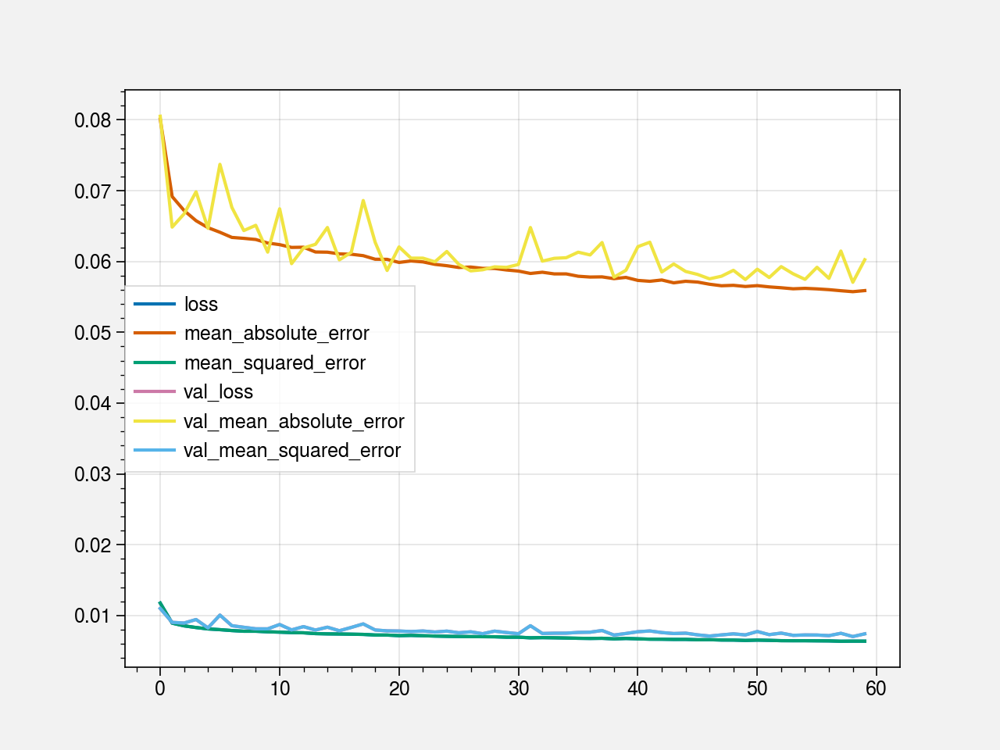

In [68]:
df.plot()

In [72]:
df_subset.pop('SCF')
df_subset

,SWE,SD,STD
0,1.305249e-06,1.462256e-05,661
1,1.402892e-07,3.667876e-06,661
2,1.532491e-09,1.537133e-08,661
3,0.000000e+00,0.000000e+00,661
4,0.000000e+00,0.000000e+00,661
...,...,...,...
35131,8.451315e-05,4.455186e-04,575
35132,8.744871e-05,4.142516e-04,575
35133,8.269584e-05,3.767498e-04,575
35134,7.933880e-05,3.512645e-04,575


In [74]:
df_val_norm = (df_subset - x_train.mean()) / x_train.std()

In [75]:
x_val_arr = np.array(df_val_norm)

In [76]:
y_out = model.predict(x_val_arr)

In [82]:
scf_regrid.size

35136

In [86]:
scf_regrid

<xarray.DataArray (time: 366, lat: 8, lon: 12)>
array([[[6.14377515e-02, 5.60093400e-02, 5.61233552e-02, ...,
         3.35974753e-02, 7.88529645e-03, 5.71252070e-03],
        [9.35360885e-02, 8.00784309e-02, 1.18053150e-01, ...,
         2.21784951e-02, 2.09090399e-02, 2.35170574e-02],
        [8.88349104e-02, 1.55253783e-01, 2.51081434e-01, ...,
         2.28332543e-02, 1.91429413e-02, 3.03920206e-02],
        ...,
        [9.79397551e-02, 9.57141834e-02, 1.05348250e-01, ...,
         5.39241565e-02, 5.18618091e-02, 3.34341978e-02],
        [6.75409615e-02, 7.89878275e-02, 8.43402511e-02, ...,
         4.97956283e-02, 8.90622337e-02, 8.63072493e-02],
        [5.65716095e-02, 7.17161064e-02, 7.51590154e-02, ...,
         1.19901405e-01, 1.51635187e-01, 1.30172437e-01]],

       [[2.97872637e-02, 3.03872327e-02, 2.68056001e-02, ...,
         2.37050571e-02, 2.19197229e-03, 1.75326926e-03],
        [3.94170147e-02, 5.04492790e-02, 8.03400407e-02, ...,
         6.69185506e-02, 2.13503857e-02, 1.59099439e-02],
        [5.01287738e-02, 1.81113471e-01, 3.25796227e-01, ...,
         2.21288918e-01, 1.22250494e-01, 3.40410269e-02],
...
        [3.04467372e-02, 2.41834990e-02, 3.85051261e-02, ...,
         3.33721365e-02, 3.93935794e-02, 2.87744375e-02],
        [2.65900142e-02, 1.53597437e-02, 1.22266113e-02, ...,
         1.77519644e-02, 1.95935829e-02, 2.97521910e-02],
        [3.31743229e-02, 1.35545883e-02, 1.20198052e-02, ...,
         1.27405256e-02, 1.21559795e-02, 1.01858450e-02]],

       [[1.57540212e-02, 1.72684396e-02, 2.21376505e-02, ...,
         3.28610074e-01, 4.86722902e-01, 4.13760995e-01],
        [3.14464589e-02, 2.14378612e-02, 2.52144947e-02, ...,
         2.56522764e-01, 2.44051950e-01, 1.49948609e-01],
        [5.33466814e-02, 6.59899658e-02, 9.54320419e-02, ...,
         2.34042057e-01, 2.74216539e-01, 1.34357723e-01],
        ...,
        [6.35837774e-02, 6.65429055e-02, 7.44038079e-02, ...,
         4.75648982e-02, 5.05811733e-02, 3.43867856e-02],
        [5.58573733e-02, 5.90824008e-02, 5.67591615e-02, ...,
         2.14381331e-02, 2.94099485e-02, 3.61373526e-02],
        [5.55993290e-02, 5.26666478e-02, 4.78298754e-02, ...,
         2.31684726e-02, 2.18397103e-02, 1.72088952e-02]]])
Coordinates:
  * time     (time) datetime64[ns] 1999-10-01 1999-10-02 ... 2000-09-30
  * lon      (lon) float32 73.125 73.375 73.625 73.875 ... 75.375 75.625 75.875
  * lat      (lat) float32 36.125 36.375 36.625 36.875 ... 37.375 37.625 37.875
Attributes:
    regrid_method:  bilinear

In [108]:
scf_out = scf_regrid.copy()

In [118]:
scf_out.transpose('lat', 'lon', 'time')[:] = y_out.reshape(8, 12, 366)

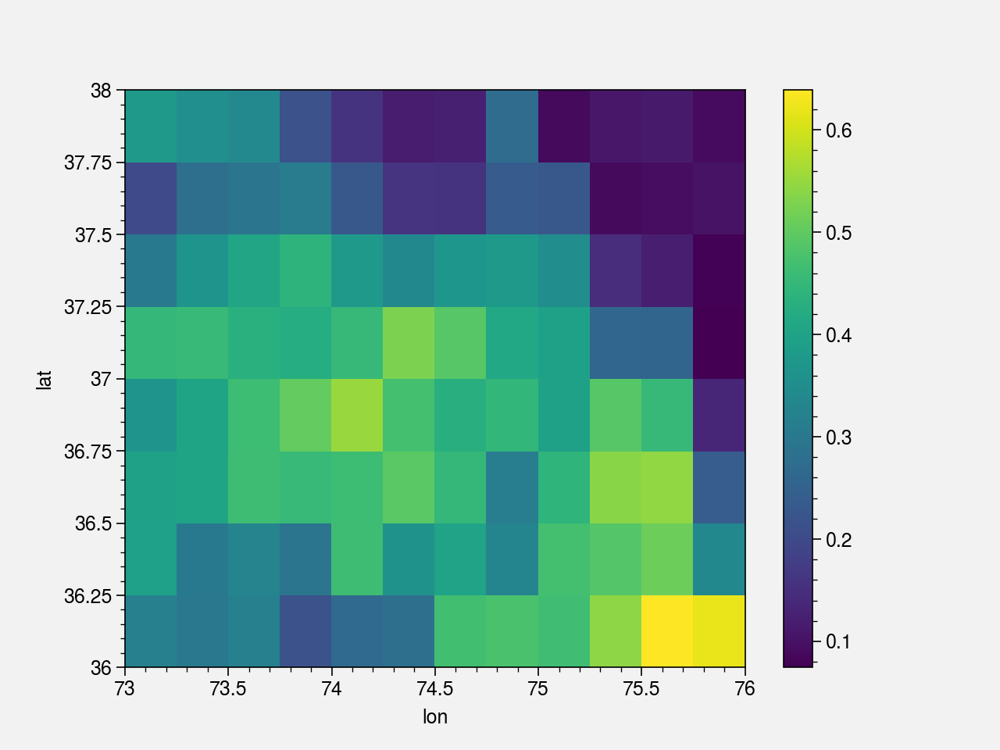

In [119]:
scf_out.mean('time').plot()

## Make functions

In [101]:
def plot_SCF(x, ylabel, name, save=False):
    y = [sd_regrid, swe_regrid, (swe_regrid/swe_regrid.max('time')), swe_regrid/sd_regrid*1000]

    xlabel = ['SD [m]', 'SWE [m]', 'SWE/SWE_max', 'rho [kg/m2]']
    cond = [(elevation_std < 400), (elevation_std > 400) & (elevation_std < 800), (elevation_std > 800)]
    label = ['STD < 400 m', '400 m < STD < 800 m', '800 m < STD']
    zorder = [3, 1, 2]

    fig, axs = plot.subplots(ncols=len(y), sharex=0)

    for i, ax in enumerate(axs):
        for c, z, l in zip(cond, zorder, label):
            ax.scatter(y[i].where(c).values.flatten(), x.where(c).values.flatten(), marker='.', alpha=0.5, zorder=z, label=l)
        ax.format(ylabel=ylabel, xlabel=xlabel[i])

        if i == 0:
            ax.legend(ncols=1)

    axs.format(
        suptitle='HMA subset UCLA Daily Snow Reanalysis (73°E-76°E; 36°N-38°N)'
    )
    
    if save:
        fig.save('img/param_1_'+name+'_SD_SWE_vs_SCF_subset.jpg')

In [102]:
def plot_SCF_monthly(x, ylabel, name, save=False):
    x = x.groupby('time.month').mean('time')
    y = [
        sd_regrid.groupby('time.month').mean('time'), 
        swe_regrid.groupby('time.month').mean('time'), 
        (swe_regrid.groupby('time.month').mean('time')/swe_regrid.max('time')), 
        swe_regrid.groupby('time.month').mean('time')/sd_regrid.groupby('time.month').mean('time')*1000
    ]
    xlim = [(0, 3.5), (0, 1.25), (0, 1), (0, 600)]

    xlabel = ['SD [m]', 'SWE [m]', 'SWE/SWE_max', 'rho [kg/m2]']
    cond = [(elevation_std < 400), (elevation_std > 400) & (elevation_std < 800), (elevation_std > 800)]
    label = ['STD < 400 m', '400 m < STD < 800 m', '800 m < STD']
    zorder = [3, 1, 2]
    months = [10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9]

    fig, axs = plot.subplots(nrows=len(y) , ncols=len(months), sharex=0, axwidth=1.7)

    k = 0
    for var, xl, xlab in zip(y, xlim, xlabel):
        for month in months:
            for c, z, l in zip(cond, zorder, label):
                axs[k].scatter(var.sel(month=month).where(c).values.flatten(), x.sel(month=month).where(c).values.flatten(), marker='.', alpha=1, zorder=z, label=l)
                axs[k].format(xlim=xl , ylim=(0,1), ylabel=ylabel, xlabel=xlab)
            k += 1

    axs[0].legend(ncols=1)   

    axs.format(
        suptitle='HMA subset UCLA Daily Snow Reanalysis (73°E-76°E; 36°N-38°N)',
        collabels=[cld.month_name[m] for m in months],
    )
    
    if save:
        fig.save('img/param_2_'+name+'_SD_SWE_vs_SCF_subset_monthly.jpg')

In [103]:
def plot_bias(scf, suptitle, title, save=False):  
    fig, axs = plot.subplots(ncols=4, nrows=3, axwidth=1.5, aspect=1.5)

    levels = plot.arange(0,1,0.05)

    param = scf.groupby('time.season').mean('time')
    obs = scf_regrid.groupby('time.season').mean('time')
    
    k = 0
    for season in (['SON', 'DJF', 'MAM', 'JJA']):
        m1 = axs[k].pcolormesh(obs.sel(season=season), cmap='viridis', levels=levels)
        k += 1
        
    for season in (['SON', 'DJF', 'MAM', 'JJA']):
        axs[k].pcolormesh(param.sel(season=season), cmap='viridis', levels=levels)
        k += 1
        
    for season in (['SON', 'DJF', 'MAM', 'JJA']):
        bias = (param-obs).sel(season=season)
        m2 = axs[k].pcolormesh(bias, cmap='RdBu', levels=plot.arange(-0.5,0.5,0.1), extend='both')
        axs[k].format(
            ultitle='RMSE = {:0.2f} %'.format((np.sqrt(u.spatial_average((bias**2))).values*100))
#             ultitle='{:0.2f} %'.format((np.sqrt(np.sum((bias**2))/bias.size).values*100))
        )
        k += 1

    fig.colorbar(m1, label='SCF', rows=(1, 2))
    fig.colorbar(m2, label='SCF bias', row=3)
    
    axs.format(
        rowlabels=['Observation\n(UCLA)', 'Param\n('+title+')', 'Param - Obs'],
        collabels=['SON', 'DJF', 'MAM', 'JJA'],
        suptitle=suptitle
    )
    
    if save:
        fig.save('img/param_3_'+title+'_bias.jpg')

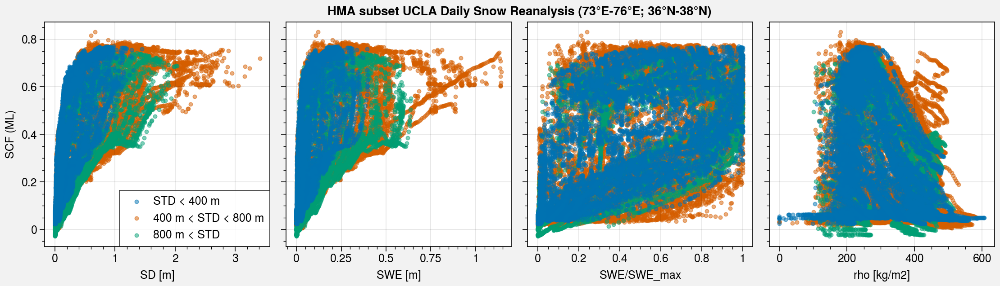

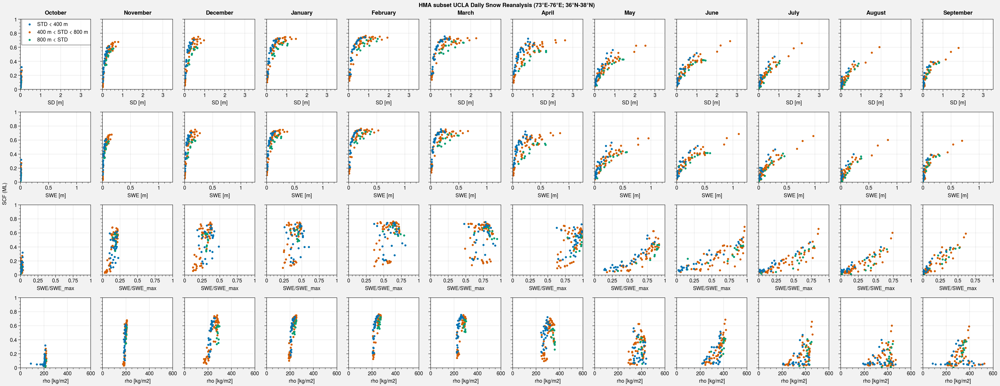

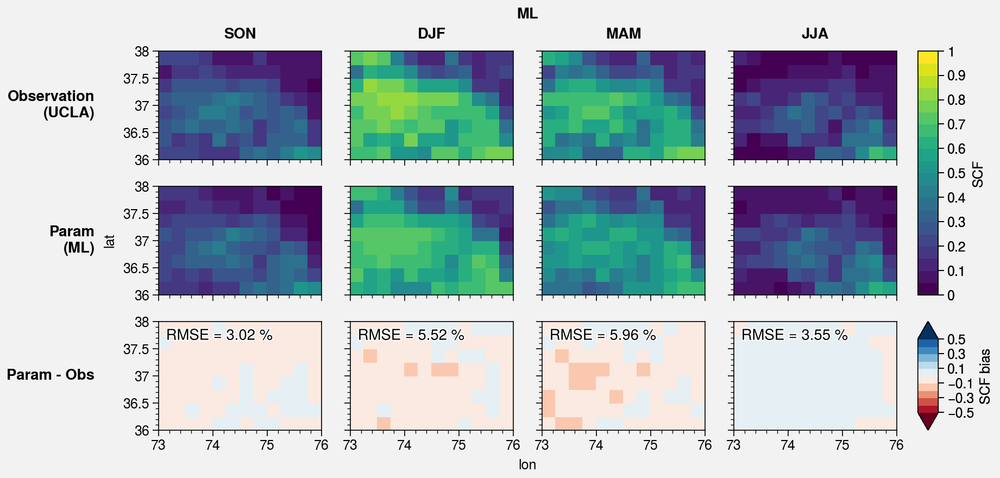

In [122]:
scf_param = scf_out
label = 'ML'
name = 'ML'
save = True

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## Check Niu and Yan 2007

In [124]:
def NY07(sd, z0, rho_snow, rho_new, m):
    return np.tanh(sd/(2.5*z0*(rho_snow/rho_new)**m))

In [125]:
scf_NY07_orig = NY07(sd_regrid, 0.01, swe_regrid/sd_regrid*1000, 100, 1.6)
scf_NY07_orch = NY07(sd_regrid, 0.01, swe_regrid/sd_regrid*1000, 50, 1)

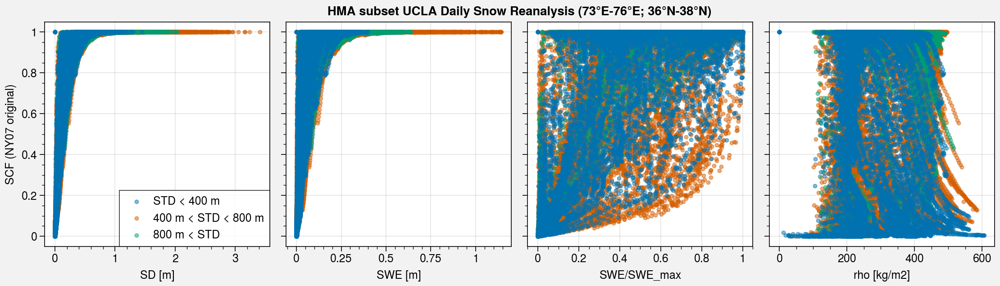

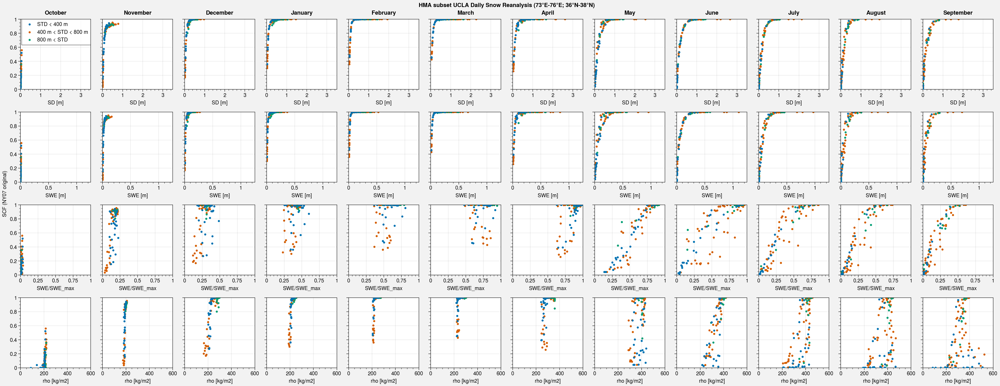

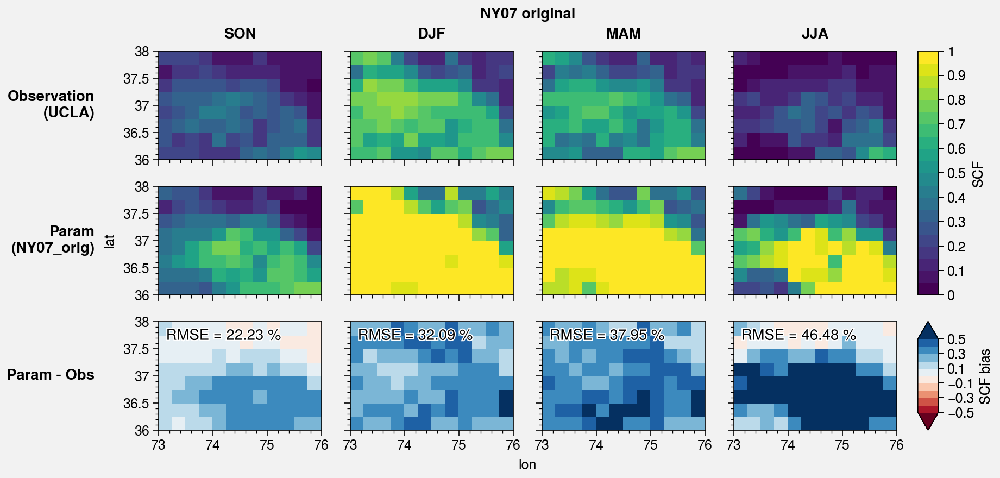

In [51]:
scf_param = scf_NY07_orig
label = 'NY07_orig'
name = 'NY07 original'
save = True

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

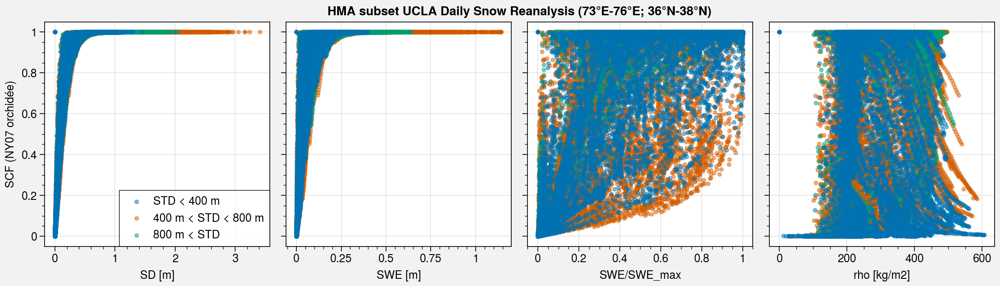

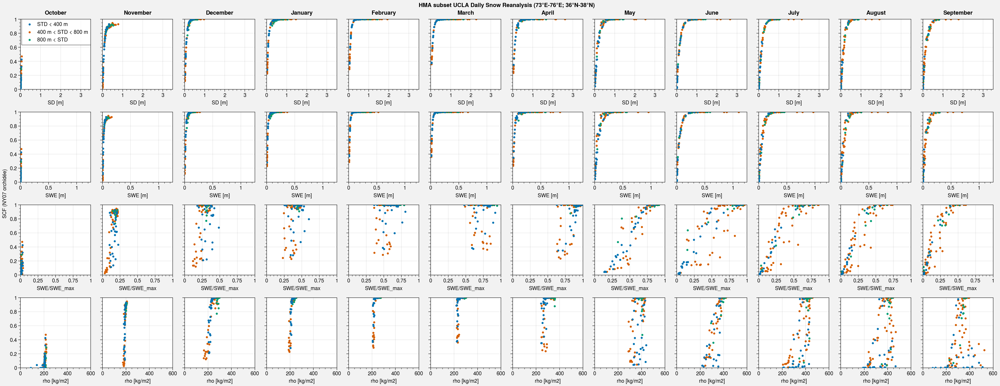

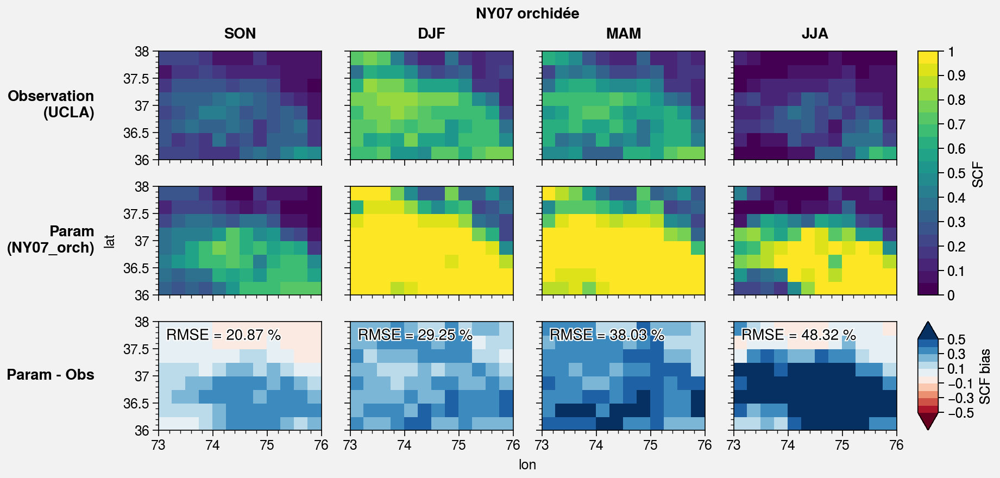

In [52]:
scf_param = scf_NY07_orch
label = 'NY07_orch'
name = 'NY07 orchidée'
save = True

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## Optimize
https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

In [77]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    z0, rho_new, m = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((NY07(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m) - scf_regrid)**2)/scf_regrid.size
    
    return mse

initial_guess = [0.01, 50, 1]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[4.39022129e-03 4.99987644e+01 2.46629896e+00]
MSE = 0.019 / RMSE = 0.139 (13.9 %)


In [72]:
initial_guess = [0.01, 100, 1.6]
mse = (f(initial_guess)).values
print('MSE = {:0.3f}'.format(mse) + ' / RMSE = {:0.3f}'.format(np.sqrt(mse)) + ' ({:0.1f} %)'.format(np.sqrt(mse)*100))

MSE = 0.149 / RMSE = 0.386 (38.6 %)


In [73]:
initial_guess = [0.01, 50, 1]
mse = (f(initial_guess)).values
print('MSE = {:0.3f}'.format(mse) + ' / RMSE = {:0.3f}'.format(np.sqrt(mse)) + ' ({:0.1f} %)'.format(np.sqrt(mse)*100))

MSE = 0.146 / RMSE = 0.383 (38.3 %)


Diminution de ~38% -> 14%

In [78]:
initial_guess = [0.01, 100, 1.6]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[2.42691772e-02 1.00008946e+02 2.46626450e+00]
MSE = 0.019 / RMSE = 0.139 (13.9 %)


2 solution équivalentes :
- z0 = 0.0044 (4.4 mm), rho_new = 50 kg/m3, m = 2.47
- z0 = 0.0243 (2.4 cm), rho_new = 100 kg/m3, m = 2.47

In [126]:
scf_NY07_opti = NY07(sd_regrid, 0.0044, swe_regrid/sd_regrid*1000, 50, 2.47)

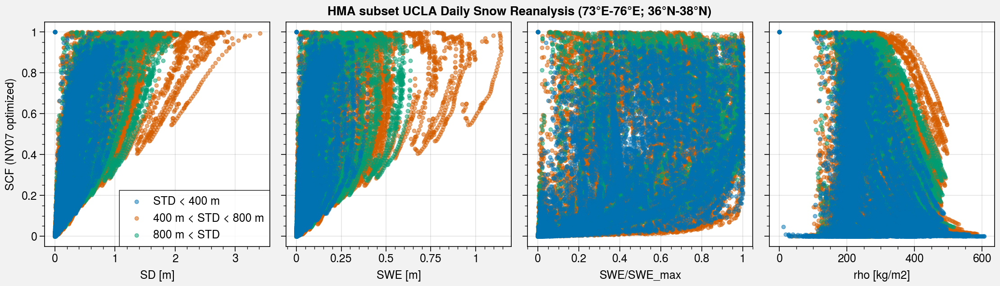

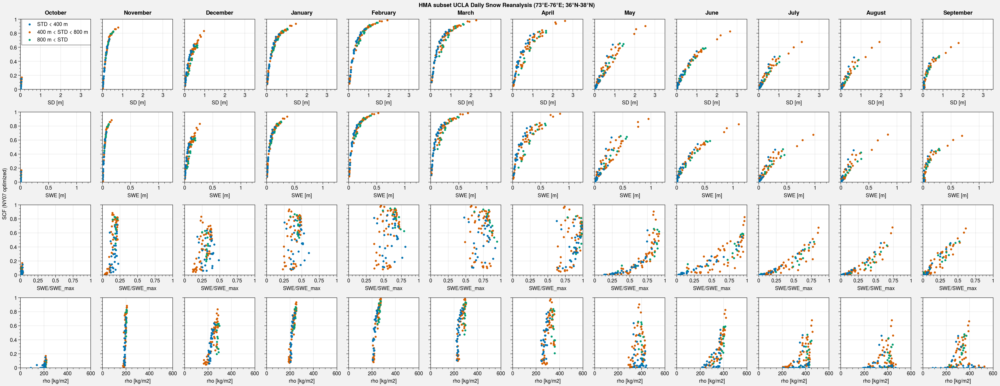

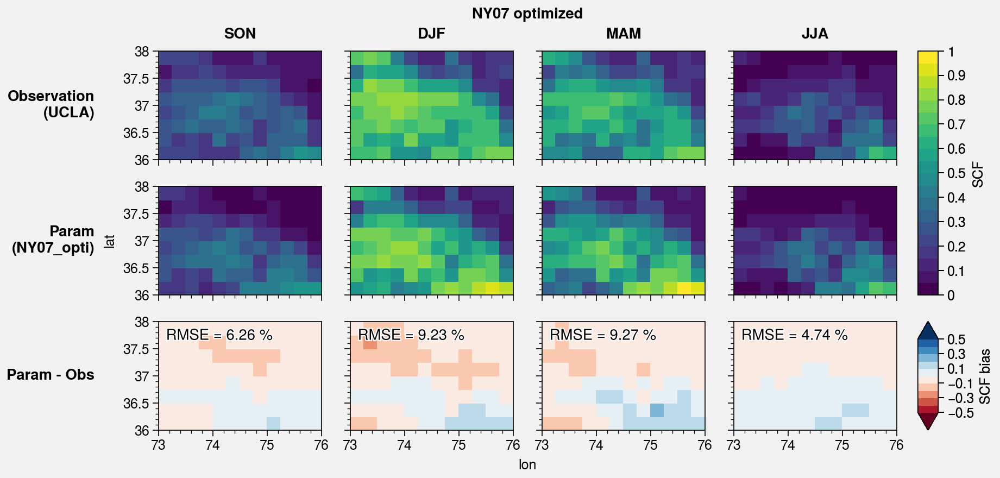

In [80]:
scf_param = scf_NY07_opti
label = 'NY07_opti'
name = 'NY07 optimized'
save = True

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## NY07 custom (with STD)

In [127]:
def NY07_custom(sd, z0, rho_snow, rho_new, m, zstd, zstd_0):
    return np.tanh(sd/(2.5*z0*(rho_snow/rho_new*(1+zstd/zstd_0))**m))

In [140]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    z0, rho_new, m, zstd_0 = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((NY07_custom(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0) - scf_regrid)**2)/scf_regrid.size
    
    return mse

initial_guess = [0.044, 50, 2.47, 200]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[3.43944050e-03 4.91636598e+01 2.23622374e+00 1.81589172e+03]
MSE = 0.017 / RMSE = 0.131 (13.1 %)


In [128]:
scf_NY07_cust = NY07_custom(sd_regrid, 3.43944050e-03, swe_regrid/sd_regrid*1000, 4.91636598e+01, 2.23622374e+00, elevation_std_subset, 1.81589172e+03)

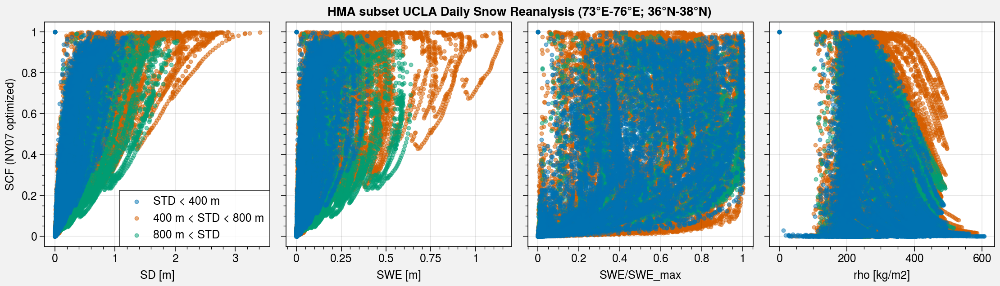

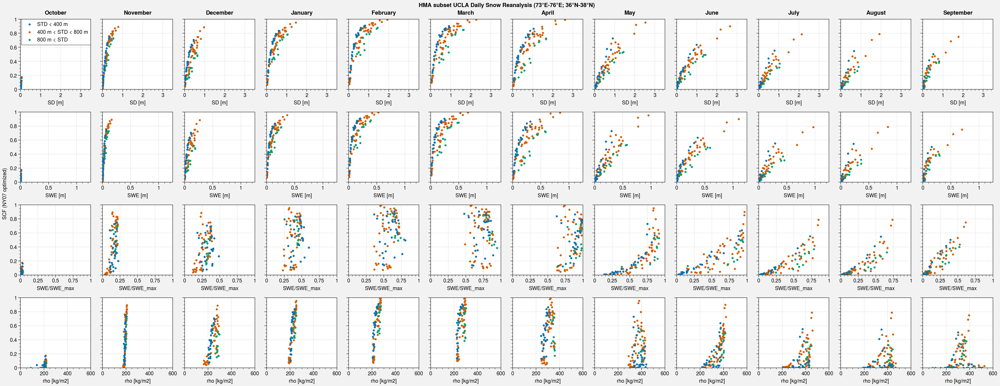

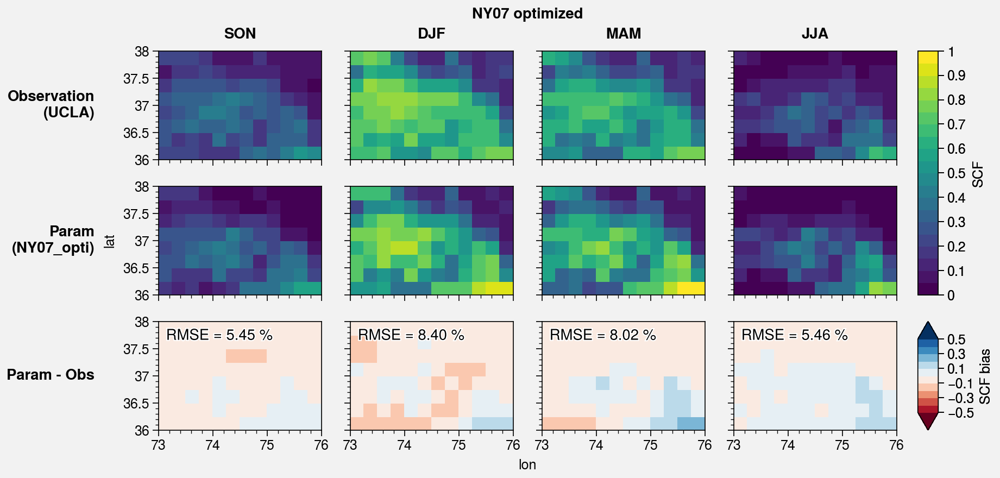

In [142]:
scf_param = NY07_custom(sd_regrid, 3.43944050e-03, swe_regrid/sd_regrid*1000, 4.91636598e+01, 2.23622374e+00, elevation_std_subset, 1.81589172e+03)
label = 'NY07_opti'
name = 'NY07 optimized'
save = False

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

In [129]:
def NY07_custom_2(sd, z0, rho_snow, rho_new, m, zstd, zstd_0, alpha):
    return (1-alpha)*np.tanh(sd/(2.5*z0*(rho_snow/rho_new*(1+zstd/zstd_0))**m))

In [156]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    z0, rho_new, m, zstd_0, alpha = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((NY07_custom(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0, alpha) - scf_regrid)**2)/scf_regrid.size
    
    return mse

# initial_guess = [0.044, 50, 2.47, 200, -0.2]
initial_guess = [3.43944050e-03, 4.91636598e+01, 2.23622374e+00, 1.81589172e+03, -0.2]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[1.05299774e-03 4.91705751e+01 2.49499081e+00 1.81589173e+03
 2.84240253e-01]
MSE = 0.011 / RMSE = 0.104 (10.4 %)


In [130]:
z0, rho_new, m, zstd_0, alpha = [1.05299774e-03, 4.91705751e+01, 2.49499081e+00, 1.81589173e+03, 2.84240253e-01]

scf_NY07_cust2 = NY07_custom_2(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0, alpha)

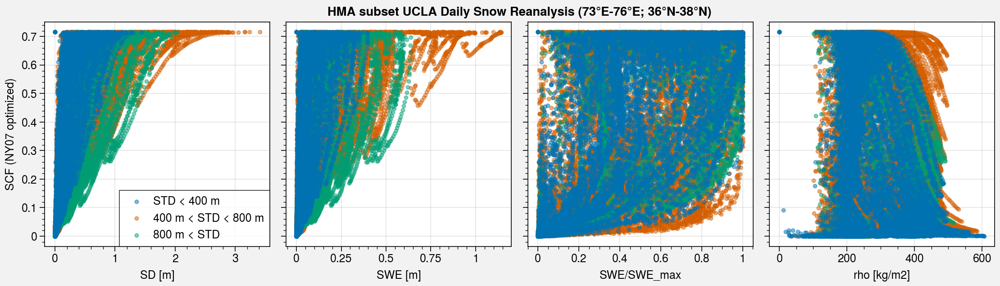

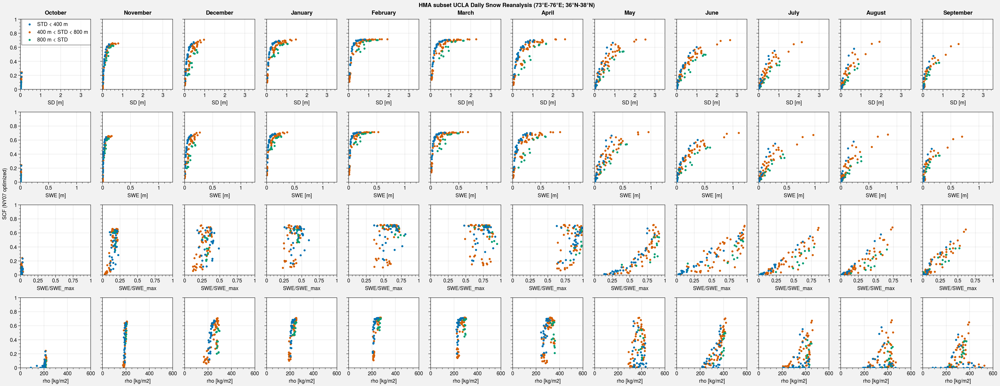

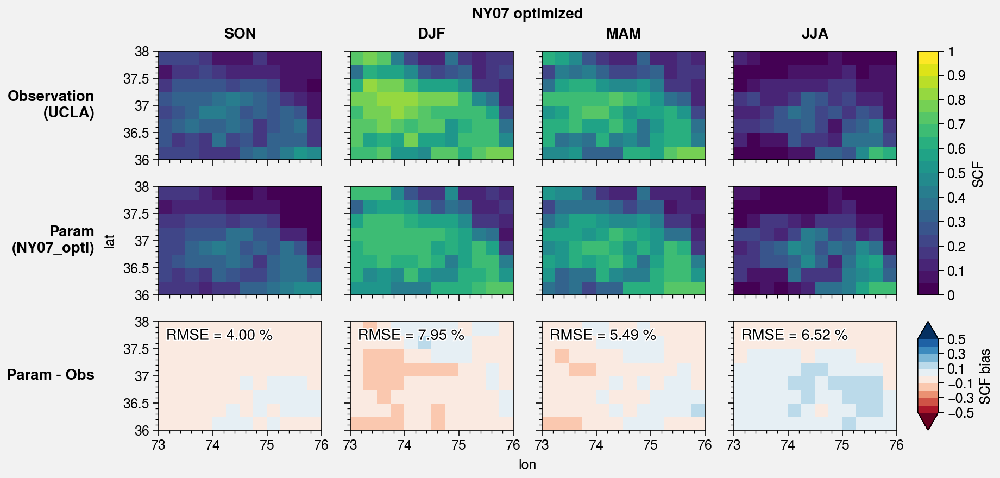

In [157]:
z0, rho_new, m, zstd_0, alpha = [1.05299774e-03, 4.91705751e+01, 2.49499081e+00, 1.81589173e+03, 2.84240253e-01]

scf_param = NY07_custom(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0, alpha)
label = 'NY07_opti'
name = 'NY07 optimized'
save = False

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## Roesch et al. 2001

In [131]:
def R01(SWE, eps, zstd):
    return 0.95 * np.tanh(100*SWE) * np.sqrt( 1000*SWE / ( 1000*SWE + eps + 0.15*zstd) )

In [132]:
scf_R01 = R01(swe_regrid, 1e-6, elevation_std_subset)

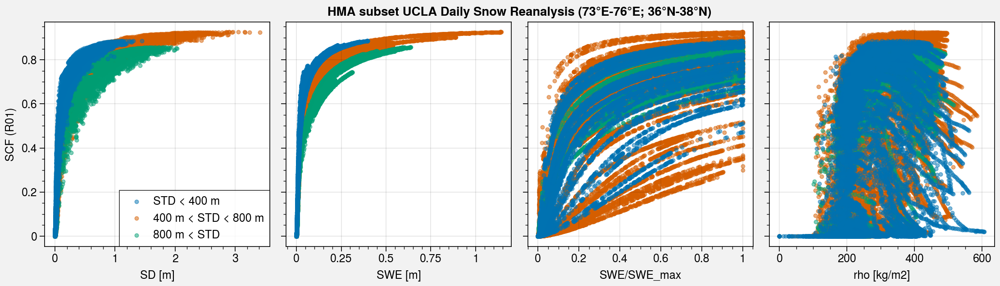

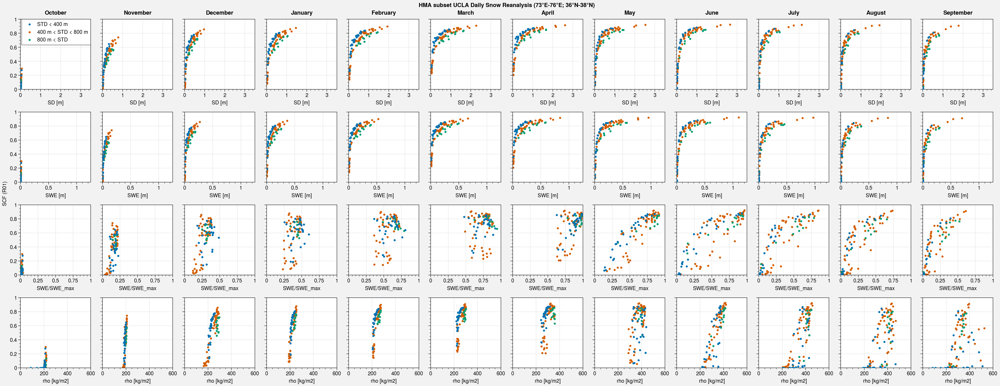

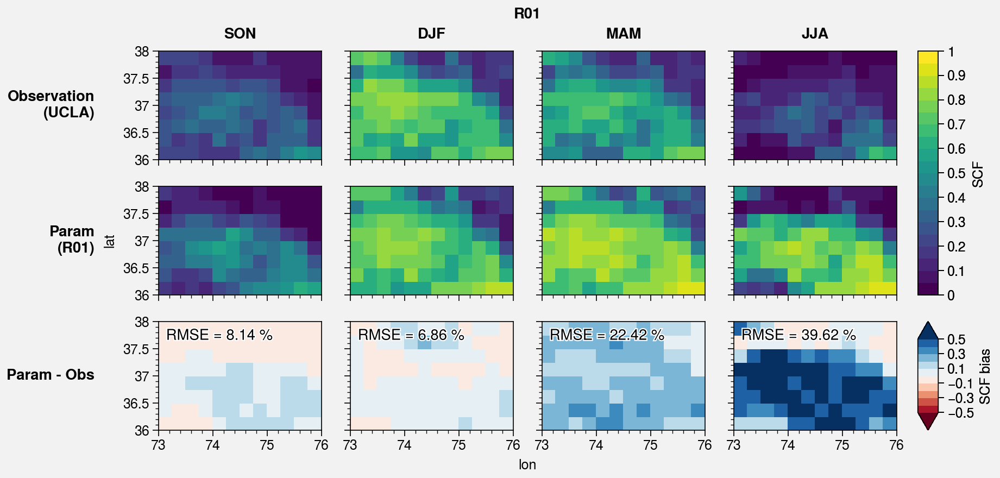

In [52]:
scf_param = scf_R01
label = 'R01'
name = 'R01'
save = False

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

In [133]:
def R01_opti(SWE, eps, zstd, alpha, a, b):
    return alpha * np.tanh(a*SWE) * np.sqrt( 1000*SWE / ( 1000*SWE + eps + b*zstd) )

In [32]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    eps, alpha, a, b = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((R01_opti(swe_regrid, eps, elevation_std_subset, alpha, a, b) - scf_regrid)**2)/scf_regrid.size
    
    return mse

initial_guess = [1e-6, 0.95, 100, 0.15]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[-1.32074358e-04  7.01853146e-01  1.00000567e+02  2.21673164e-01]
MSE = 0.035 / RMSE = 0.186 (18.6 %)


In [134]:
scf_R01_opti = R01_opti(swe_regrid, -1.32e-4, elevation_std_subset, 0.7, 100, 0.22)

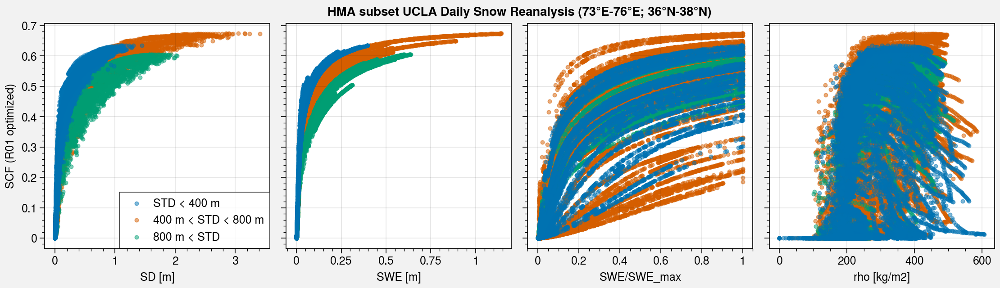

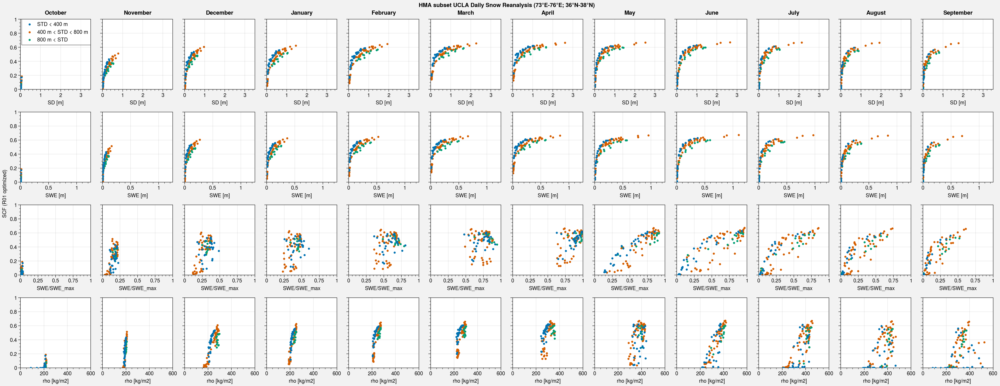

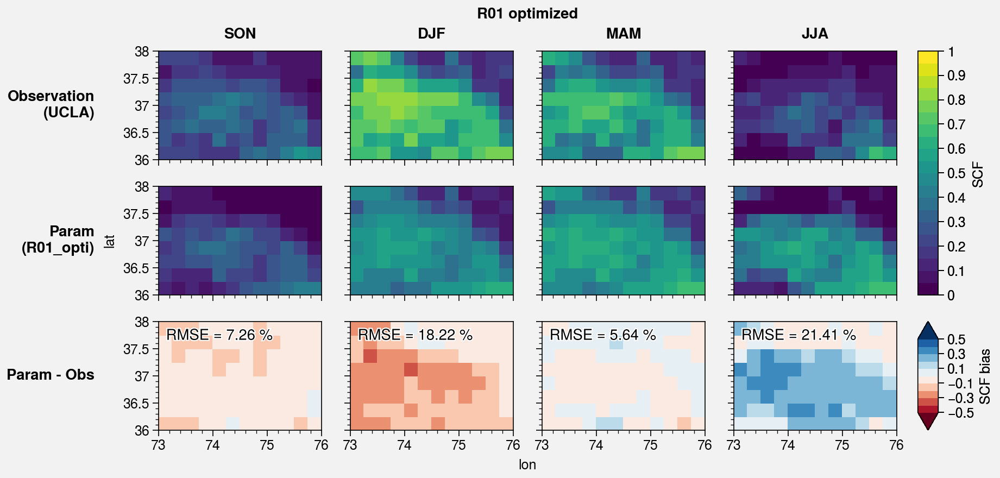

In [36]:
scf_param = scf_R01_opti
label = 'R01_opti'
name = 'R01 optimized'
save = True

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## Check time series

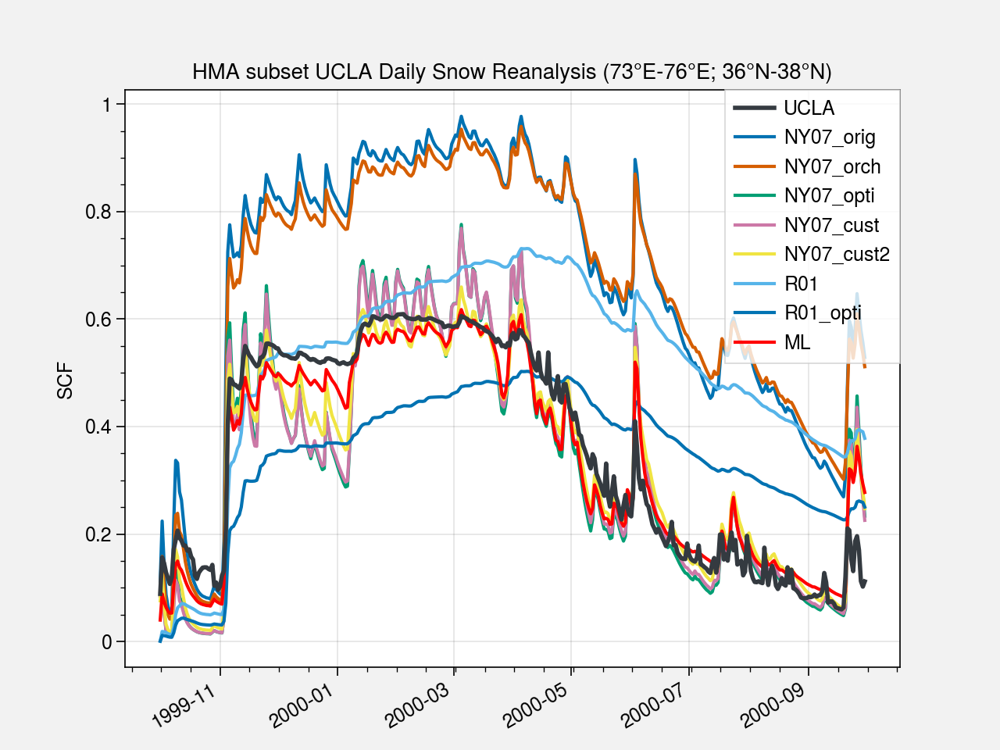

In [137]:
plt.figure()

scf_regrid.mean(('lat', 'lon')).plot(label='UCLA', color='gray8', linewidth=2, zorder=10)
scf_NY07_orig.mean(('lat', 'lon')).plot(label='NY07_orig')
scf_NY07_orch.mean(('lat', 'lon')).plot(label='NY07_orch')
scf_NY07_opti.mean(('lat', 'lon')).plot(label='NY07_opti')
scf_NY07_cust.mean(('lat', 'lon')).plot(label='NY07_cust')
scf_NY07_cust2.mean(('lat', 'lon')).plot(label='NY07_cust2')
scf_R01.mean(('lat', 'lon')).plot(label='R01')
scf_R01_opti.mean(('lat', 'lon')).plot(label='R01_opti')
scf_out.mean(('lat', 'lon')).plot(label='ML', color='red')

plt.ylabel('SCF')
plt.xlabel('')
plt.title('HMA subset UCLA Daily Snow Reanalysis (73°E-76°E; 36°N-38°N)')

plt.legend()

plt.savefig('img/1999-2000_subset_timeseries_HMA_UCLA_params_ML.jpg')